# PulseMatch 1D Convolutional Neural Network (CNN)

## Project Overview
This notebook implements the **PulseMatch 1D-CNN**, a deep learning model designed to predict FIR filter coefficients from input pulse signals. The model uses a combination of convolutional and dense layers to capture temporal features and generate predictions for the FIR pulse shaping filter. This notebook explicitly examines **PulseMatch 1D CNN** against the dataset scenario #5, which consists of 32QAM, (RECTANGLE & GAUSSIAN) FIR filters, and 0.10 noise percentage. Please see https://github.com/yalongwastaken/pulsematch/blob/main/src/notes.txt for information about the different training scenarios.


## Setup

This section prepares the environment for training the PulseMatch 1D Convolutional Neural Network (CNN).

### Steps

1. **Imports**  
   Import the custom `DataLoader` class & other essential libraries.

2. **Mount Google Drive**  
   Mount Google Drive to access datasets, saved models, etc.


In [1]:
# @title Imports
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from google.colab import drive
from data_loader import DataLoader
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
# @title Mount Google Drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## Data Development

In this section, we load the dataset using the custom `DataLoader`, visualize sample batches, and apply preprocessing steps.

### Steps

1. **Load the Dataset**  
   Utilize the `DataLoader` class to read the dataset from the specified paths.

2. **Visualize Data**  
   Plot a few examples from the training batches.

3. **Preprocessing**  
   Apply preprocessing to adjust the batches to conform to (input, output) and repeat the data.


In [3]:
# @title Load the Dataset

FILE_PATH_A = "/content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/data/dataset_5a.h5"
FILE_PATH_B = "/content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/data/dataset_5b.h5"
FILE_PATH_C = "/content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/data/dataset_5c.h5"

dataloader = DataLoader()

# Full dataset
dataset = None

# Load file A
dataloader.load_h5_dataset(FILE_PATH_A)
dataloader.create_tf_dataset()
dataset = dataloader.get_dataset()

# Load file B
dataloader.load_h5_dataset(FILE_PATH_B)
dataloader.create_tf_dataset()
dataset = dataset.concatenate(dataloader.get_dataset())

# Load file C
dataloader.load_h5_dataset(FILE_PATH_C)
dataloader.create_tf_dataset()
dataset = dataset.concatenate(dataloader.get_dataset())

# Split dataset 8:1:1
dataset = dataset.shuffle(50000)

dataset_len = sum(1 for _ in dataset)
train_size = int(0.8 * dataset_len)
val_size = int(0.1 * dataset_len)
test_size = dataset_len - train_size - val_size

print(f"Dataset length: {dataset_len}")
print(f"Training size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

dataset_train = dataset.take(train_size)
dataset_val = dataset.skip(train_size).take(val_size)
dataset_test = dataset.skip(train_size + val_size).take(test_size)

Dataset length: 1203
Training size: 962
Validation size: 120
Test size: 121


In [ ]:
# @title Visualize Data
dataloader.plot_batch(dataset_train)

Output hidden; open in https://colab.research.google.com to view.

In [4]:
# @title Preprocessing
# Preprocessing function
def preprocess_data(dataset):
  def map_fn(signals, fir_filters, *_):
    return signals, fir_filters

  return dataset.map(map_fn)

# Apply preprocessing to the datasets
dataset_train = preprocess_data(dataset_train)
dataset_val = preprocess_data(dataset_val)
dataset_test = preprocess_data(dataset_test)

# Examine
print(next(iter(dataset_train)))

(<tf.Tensor: shape=(32, 8135, 2), dtype=float32, numpy=
array([[[ 0.63664407, -1.4549562 ],
        [-0.9534797 , -0.14227283],
        [-0.37795475,  0.32806832],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       [[-1.2170876 ,  0.49668944],
        [-1.1458888 ,  0.42309183],
        [ 1.4369311 ,  1.1676629 ],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       [[-1.8607577 ,  0.6891226 ],
        [-1.47868   , -0.42519018],
        [-0.74417084, -0.8900504 ],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       ...,

       [[ 0.29841802,  1.0111461 ],
        [ 0.1283031 , -0.05700877],
        [ 0.6906722 , -0.88032025],
        ...,
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ],
        [ 0.        ,  0.        ]],

       

## Model Development

In this section, we define the **PulseMatch 1D Convolutional Neural Network (CNN)** architecture, train the model, monitor the training process using TensorBoard and loss curves, and perform hyperparameter tuning.

### Steps

1. **PulseMatch 1D-CNN Class**  
   Implement the `PulseMatchCNN` class as a subclass of `tf.keras.Model`.

2. **Model Training**  
   Compile and train the model using the preprocessed training and validation datasets.

3. **Analysis and Visualization**  
   Visualize the results by using TensorBoard.

4. **Evaluation**   
   Evaluate the loss against the test dataset.

5. **OPTIONAL: Save Model**   
   Save the model for further development/use/

In [5]:
# @title PulseMatch 1D-CNN Class
class PulseMatchCNN(tf.keras.Model):
  def __init__(
    self,
    num_dense_layers: int = 3,
    dense_layer_size: int = 64,
    dropout: float = 0.1,
    non_zero_weight: float = 100.0,
    kernel_regularizer: tf.keras.regularizers.Regularizer = None,
    **kwargs
  ) -> None:
    super().__init__(**kwargs)

    # Model parameters
    self.num_dense_layers = num_dense_layers
    self.dense_layer_size = dense_layer_size
    self.dropout = dropout
    self.non_zero_weight = non_zero_weight
    self.kernel_regularizer = kernel_regularizer

    # Build the model
    self.model = self.make_model()

  def make_model(self) -> tf.keras.Model:
    """
    Create PulseMatchCNN model with convolutional layers followed by dense layers.
    """
    inputs = tf.keras.Input(shape=(None, 2))

    # Convolutional layers
    x = self._conv_block(inputs, 8, 128)
    x = self._conv_block(x, 32, 64)
    x = self._conv_block(x, 128, 32)
    x = self._conv_block(x, 256, 16)

    # Global Average Pooling
    x = tf.keras.layers.GlobalAveragePooling1D()(x)

    # Dense layers
    for _ in range(self.num_dense_layers):
      x = tf.keras.layers.Dense(
        self.dense_layer_size,
        activation='relu',
        kernel_regularizer=self.kernel_regularizer
      )(x)
      x = tf.keras.layers.Dropout(self.dropout)(x)

    # Output heads
    fir_output = tf.keras.layers.Dense(432, activation='tanh', name='fir_output')(x)

    return tf.keras.Model(inputs=inputs, outputs=fir_output)

  def _conv_block(self, x, filters: int, kernel_size: int) -> tf.Tensor:
    """
    Helper function to create a convolution block with BatchNormalization,
    ReLU activation, and MaxPooling1D.
    """
    x = tf.keras.layers.Conv1D(filters, kernel_size, activation=None, kernel_initializer='he_normal')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.MaxPooling1D(2)(x)
    return x

  def call(self, inputs: tf.Tensor, training: bool = False) -> tf.Tensor:
    return self.model(inputs=inputs, training=training)

  def compute_loss(
    self,
    x: tf.Tensor,
    y_true: tf.Tensor,
    y_pred: tf.Tensor,
    sample_weight: tf.Tensor = None
  ) -> tf.Tensor:
    """
    Compute loss function with higher weighting for non-zero values.
    """
    # Compute MSE
    mask = tf.cast(tf.not_equal(y_true, 0), tf.float32)
    weight_mask = 1.0 + (mask * (self.non_zero_weight - 1.0))
    fir_loss = tf.reduce_sum(weight_mask * tf.square(y_true - y_pred)) / (tf.reduce_sum(weight_mask) + 1e-8)

    # Combined losses
    total_loss = fir_loss

    if sample_weight is not None:
      total_loss = tf.reduce_sum(total_loss * sample_weight) / (tf.reduce_sum(sample_weight) + 1e-8)

    return total_loss

  def save_model(self, path: str) -> None:
    self.model.save(path)

  def load_model(self, path: str) -> None:
    self.model = tf.keras.models.load_model(path)
    print(f"Full model loaded from {path}")

In [ ]:
# @title Model Training

# Initialize model
pulsematchCNN = PulseMatchCNN(
  num_dense_layers=3,
  dense_layer_size=64,
  dropout=0.25,
  non_zero_weight=100.0,
  kernel_regularizer=tf.keras.regularizers.l2(0.0001)
)

# Decaying Learning Rate
initial_lr = 0.01
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
  initial_learning_rate=initial_lr,
  decay_steps=1000,
  decay_rate=0.96,
  staircase=True
)

# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
pulsematchCNN.compile(optimizer=optimizer, loss=pulsematchCNN.compute_loss)

# Model callbacks
callbacks = [
  tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
  tf.keras.callbacks.TensorBoard(log_dir='./logs'),
  tf.keras.callbacks.ModelCheckpoint(
    filepath='/content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/models/pulsematch_cnn_initial_training_5.keras',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
  )
]

# Train the model
history = pulsematchCNN.fit(
  dataset_train,
  epochs=100,
  steps_per_epoch=256,
  callbacks=callbacks,
  validation_data=dataset_val,
  validation_steps=128
)

Epoch 1/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.0022 

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 1: val_loss improved from inf to 0.00050, saving model to /content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/models/pulsematch_cnn_initial_training_5.keras
256/256 ━━━━━━━━━━━━━━━━━━━━ 1006s 4s/step - loss: 0.0022 - val_loss: 4.9714e-04
Epoch 2/100
256/256 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 2.9571e-04
Epoch 2: val_loss improved from 0.00050 to 0.00029, saving model to /content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/models/pulsematch_cnn_initial_training_5.keras
256/256 ━━━━━━━━━━━━━━━━━━━━ 455s 2s/step - loss: 2.9560e-04 - val_loss: 2.9065e-04
Epoch 3/100
252/256 ━━━━━━━━━━━━━━━━━━━━ 2s 566ms/step - loss: 2.1480e-04
Epoch 3: val_loss improved from 0.00029 to 0.00023, saving model to /content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/models/pulsematch_cnn_initial_training_5.keras
256/256 ━━━━━━━━━━━━━━━━━━━━ 195s 763ms/step - loss: 2.1494e-04 - val_loss: 2.3061e-04
Epoch 4/100
194/256 ━━━━━━━━━━━━━━━━━━━━ 18s 298ms/step - loss: 2.070

In [ ]:
# @title Analysis & Visualization

# Visualize history
loss = history.history['loss']
val_loss = history.history['val_loss']

# Print loss arrays
print(f"Loss: {loss}")
print(f"Validation Loss: {val_loss}")

# Plot loss arrays
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend()
plt.show()

# tensorboard
%load_ext tensorboard
%tensorboard --logdir=./logs

Output hidden; open in https://colab.research.google.com to view.

In [6]:
# @title OPTIONAL: Load Model
pulsematchCNN = PulseMatchCNN()
pulsematchCNN.load_model('/content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/models/pulsematch_cnn_5.keras')

Full model loaded from /content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/models/pulsematch_cnn_5.keras


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


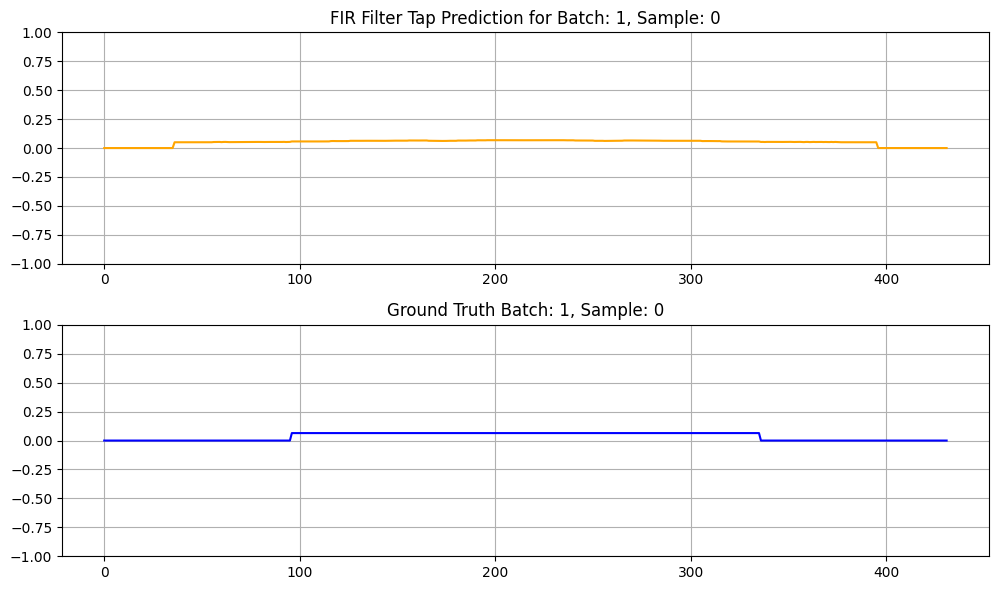

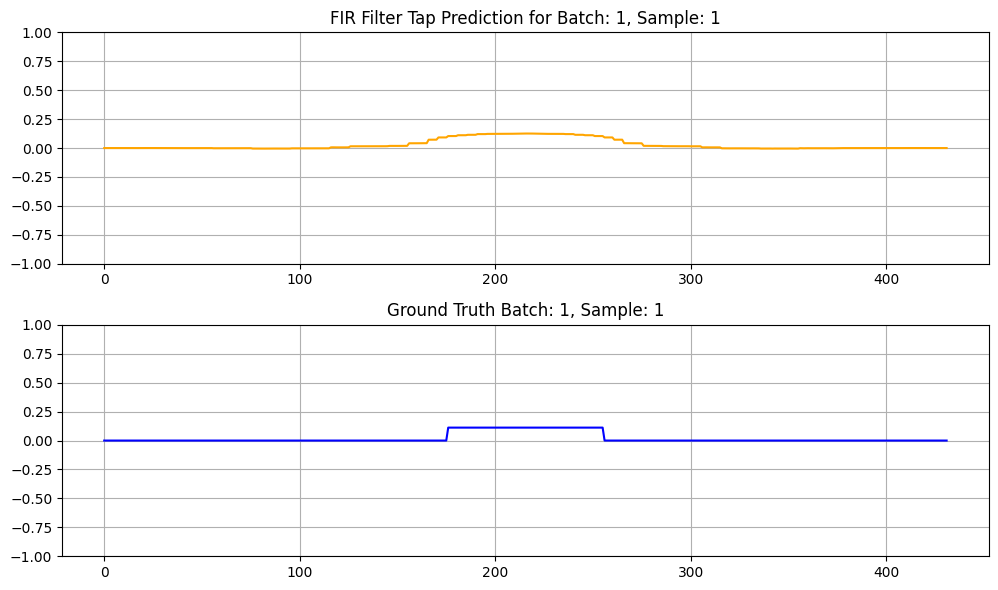

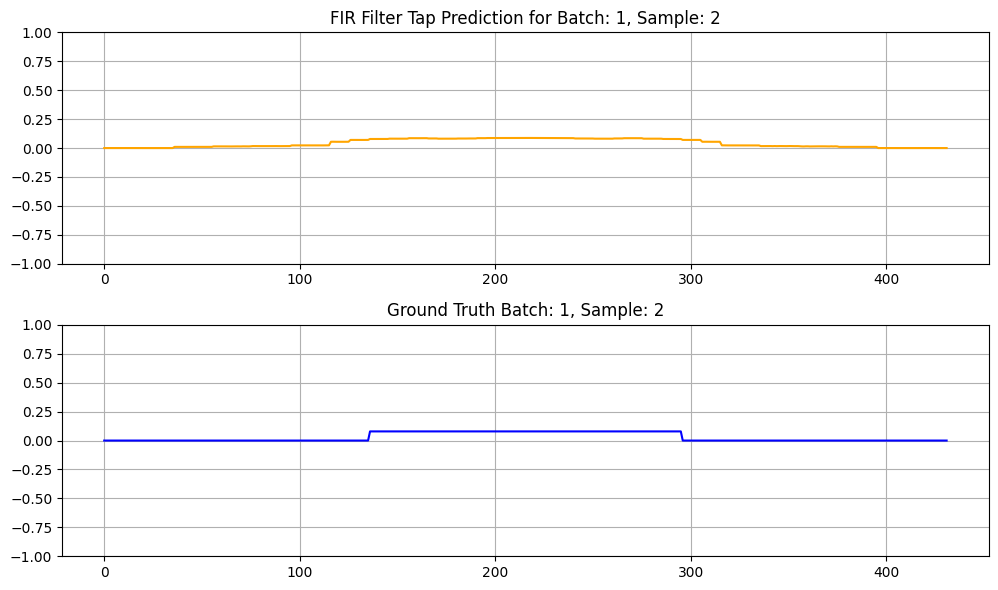

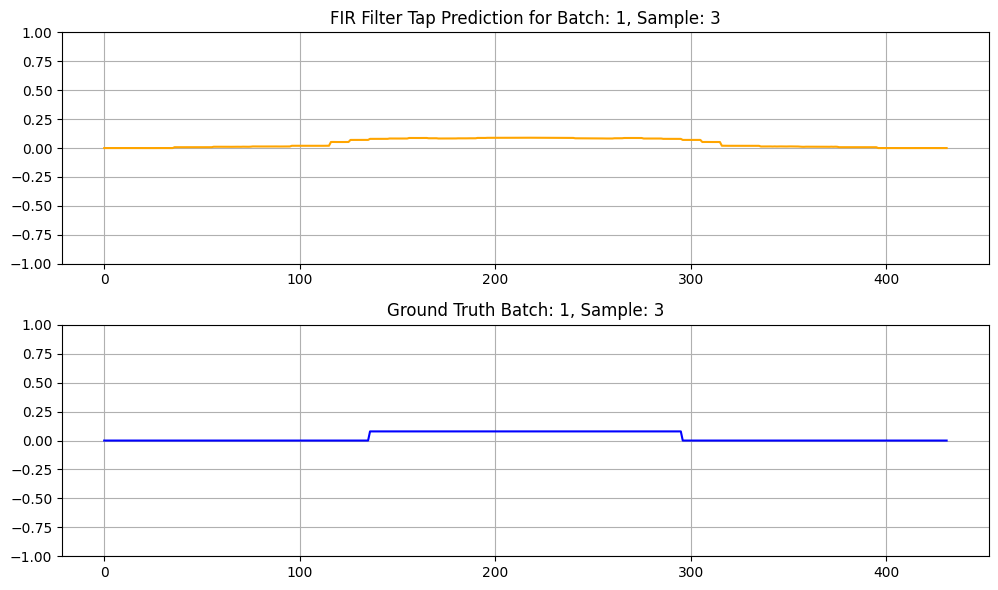

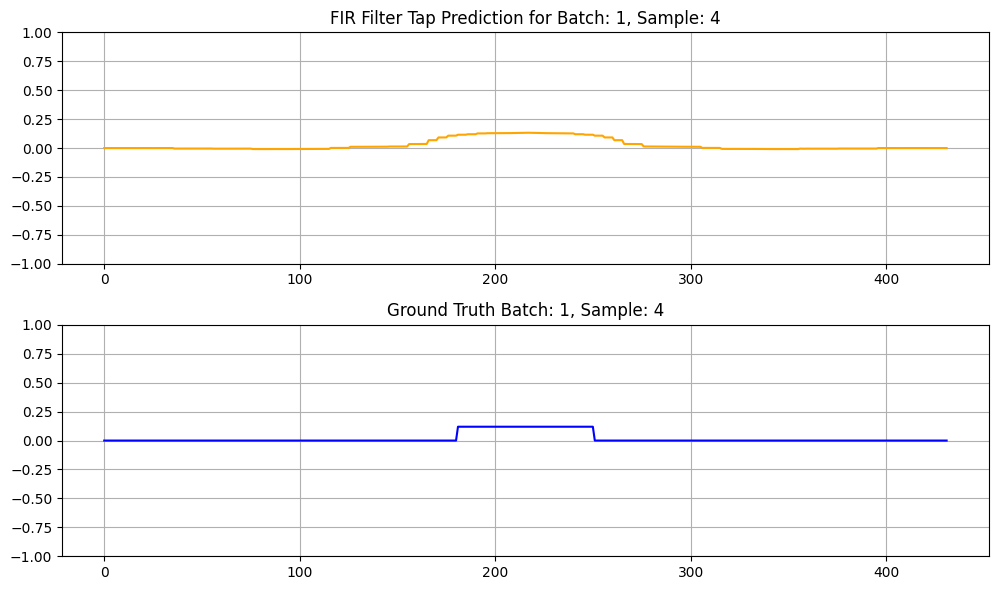

...

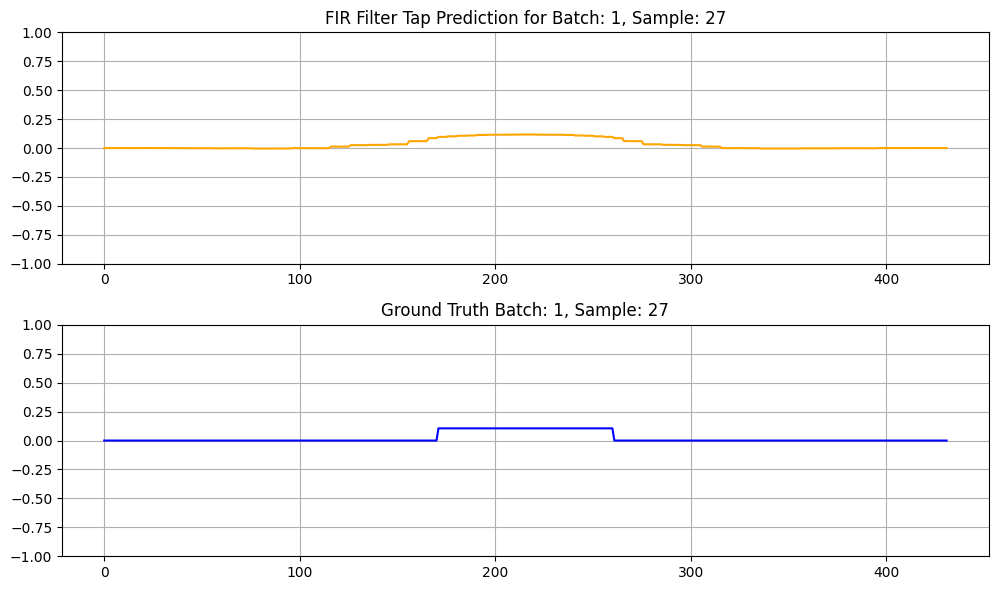

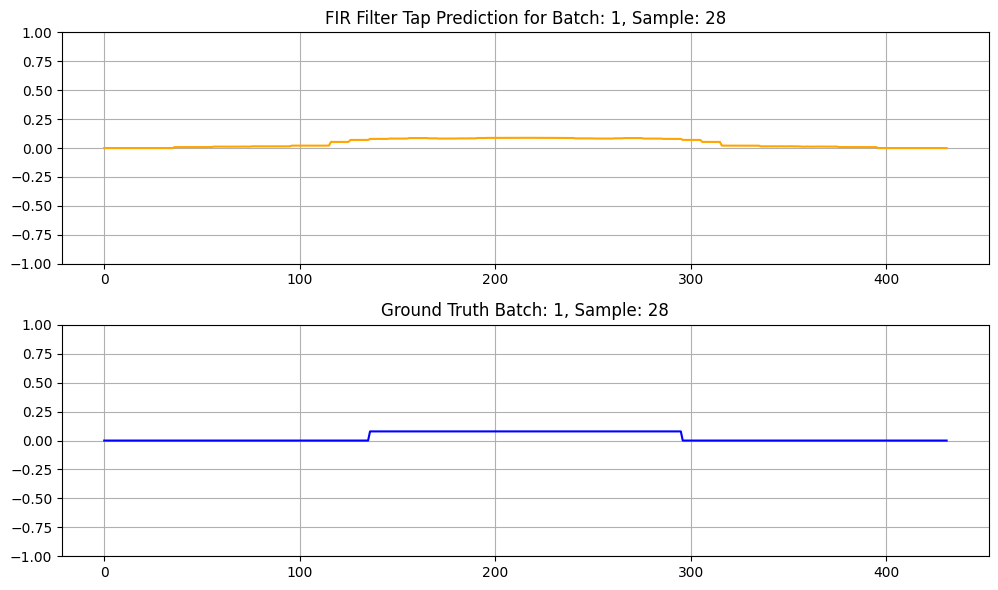

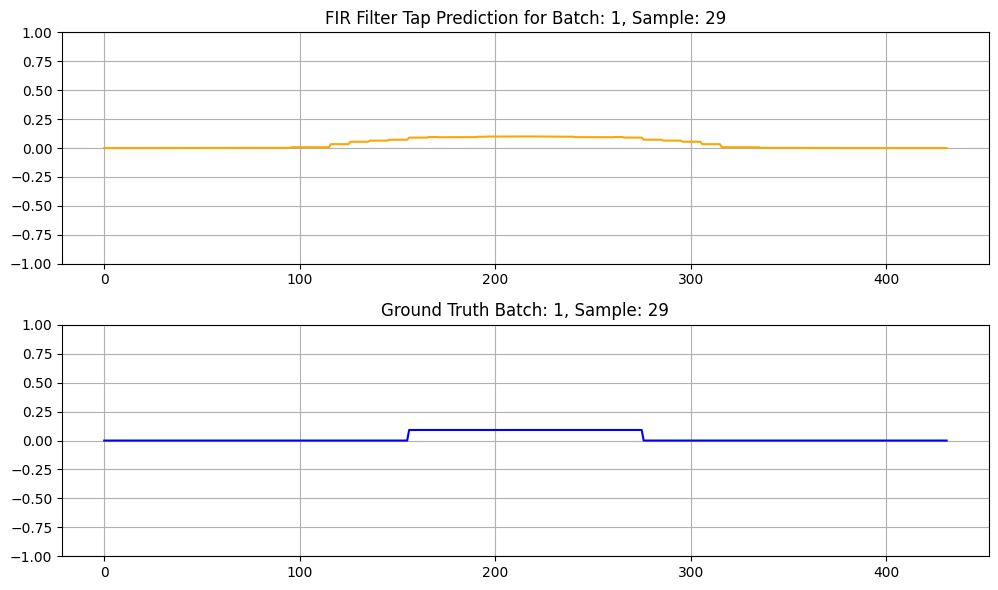

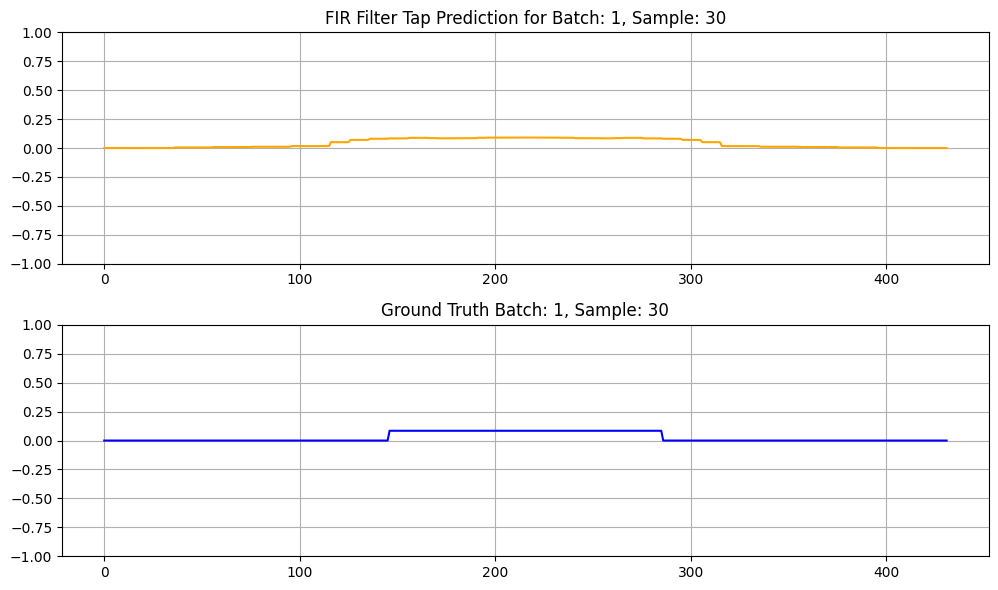

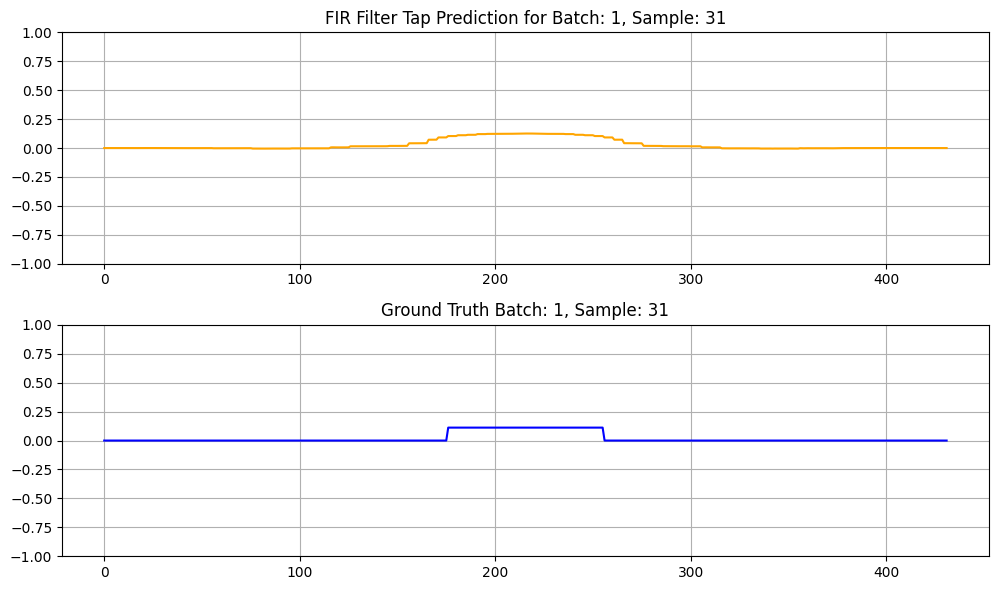

In [ ]:
# @title Analysis & Visualization Cont.
# Set batch index for fetching the batch
batch_index = 1
dataset_batch = dataset_test.skip(batch_index).take(1)

dataset_test_x, dataset_test_y = next(iter(dataset_batch))

# Get predictions
predictions = pulsematchCNN.predict(dataset_test_x)

# Plot predictoins
for i in range(len(predictions)):
  plt.figure(figsize=(10, 6))

  # First subplot: Predicted FIR filter values
  plt.subplot(2, 1, 1)
  plt.plot(predictions[i], label='Predictions', color='orange')
  plt.title(f'FIR Filter Tap Prediction for Batch: {batch_index}, Sample: {i}')
  plt.ylim(-1, 1)
  plt.grid(True)

  # Second subplot: Ground truth FIR filter values
  plt.subplot(2, 1, 2)
  plt.plot(dataset_test_y[i], label='Ground Truth', color='blue')
  plt.title(f'Ground Truth Batch: {batch_index}, Sample: {i}')
  plt.ylim(-1, 1)
  plt.grid(True)

  plt.tight_layout()
  plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step 
1/1 ━━━━━━━━━

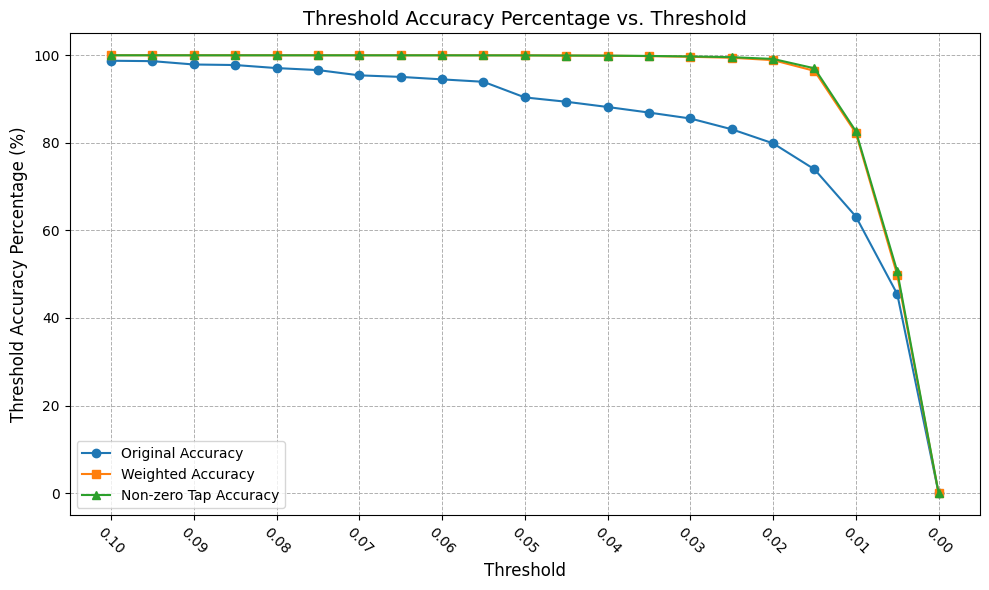

In [7]:
# @title Evaluation
all_true = []
all_pred = []

# Iterate over the entire test dataset
for batch_x, batch_y in dataset_test:
    batch_pred = pulsematchCNN.predict(batch_x)
    all_true.append(batch_y.numpy())
    all_pred.append(batch_pred)

all_true = np.vstack(all_true)
all_pred = np.vstack(all_pred)

# Compute MSEs
raw_mse_loss = np.mean((all_true - all_pred) ** 2)
weighted_mse_loss = np.mean(np.abs(all_true) * (all_true - all_pred) ** 2)

print(f"Raw MSE Loss: {raw_mse_loss}")
print(f"Log Raw MSE Loss: {-np.log10(raw_mse_loss)}")
print(f"Weighted MSE Loss: {weighted_mse_loss}")
print(f"Log Weighted MSE Loss: {-np.log10(weighted_mse_loss)}")

# Cosine Similarity
cos_sim_matrix = cosine_similarity(all_true, all_pred)
mean_cosine_similarity = np.mean(np.diag(cos_sim_matrix))
print(f"Mean Cosine Similarity: {mean_cosine_similarity:.6f}")

# Frequency Response Difference (FFT L2 Norm)
def fft_l2_diff(true_batch, pred_batch):
    total_diff = 0.0
    for true_taps, pred_taps in zip(true_batch, pred_batch):
        true_fft = np.fft.fft(true_taps)
        pred_fft = np.fft.fft(pred_taps)
        diff = np.linalg.norm(true_fft - pred_fft)
        total_diff += diff
    return total_diff / len(true_batch)

freq_response_diff = fft_l2_diff(all_true, all_pred)
print(f"Frequency Response Difference (FFT L2 Norm): {freq_response_diff:.6f}")

# Threshold Accuracies
thresholds = np.linspace(0.10, 0, num=21)

original_accuracies = []
weighted_accuracies = []
nonzero_accuracies = []

errors = np.abs(all_true - all_pred)
weights = np.abs(all_true)

for threshold in thresholds:
    correct = (errors < threshold).astype(np.float32)

    # Original Accuracy
    acc = np.mean(correct) * 100
    original_accuracies.append(acc)

    # Weighted Accuracy
    weighted_correct = correct * weights
    weighted_total = weights + 1e-8
    weighted_acc = np.sum(weighted_correct) / np.sum(weighted_total) * 100
    weighted_accuracies.append(weighted_acc)

    # Non-zero Accuracy
    nonzero_mask = all_true != 0.0
    filtered_correct = correct[nonzero_mask]
    nonzero_acc = np.mean(filtered_correct) * 100
    nonzero_accuracies.append(nonzero_acc)

# Print accuracies
print(f"Original Accuracy: {original_accuracies}")
print(f"Weighted Accuracy: {weighted_accuracies}")
print(f"Non-zero Tap Accuracy: {nonzero_accuracies}")

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(thresholds, original_accuracies, marker='o', label='Original Accuracy')
plt.plot(thresholds, weighted_accuracies, marker='s', label='Weighted Accuracy')
plt.plot(thresholds, nonzero_accuracies, marker='^', label='Non-zero Tap Accuracy')

plt.xlabel('Threshold', fontsize=12)
plt.ylabel('Threshold Accuracy Percentage (%)', fontsize=12)
plt.title('Threshold Accuracy Percentage vs. Threshold', fontsize=14)
plt.gca().invert_xaxis()
plt.xticks(np.round(np.arange(0.10, -0.001, -0.01), 3), fontsize=10, rotation=-45)
plt.grid(True, linestyle='--', linewidth=0.7)
plt.legend(loc='lower left')
plt.tight_layout()
plt.show()


In [ ]:
# @title Optional: Save Model Again
save_path = '/content/drive/MyDrive/academics/gwu/2024-2025/spring/CSCI 4366/models'
os.makedirs(save_path, exist_ok=True)
pulsematchCNN.save_model(os.path.join(save_path, 'pulsematch_cnn_5.keras'))